In [ ]:
import tensorflow as tf
import numpy as np
import keras
import matplotlib.pyplot as plt
import os
import cv2 as cv
import random

In [ ]:
tf.random.set_seed(42)

In [ ]:
train= r'/content/drive/MyDrive/catvsdog/train_transformed'

category = ['cat','dog']

train_data = []

In [ ]:
i = 0
for img in os.listdir(train):
    if i < 1000:
      array = cv.imread(os.path.join(train,img),cv.IMREAD_UNCHANGED)
      train_data.append([array,0])
      print(os.path.join(train,img))
    else:
      array = cv.imread(os.path.join(train,img),cv.IMREAD_UNCHANGED)
      train_data.append([array,1])
      print(os.path.join(train,img))
    print(".",end = "")
    i+=1

/content/drive/MyDrive/catvsdog/train_transformed/cat1.jpg
./content/drive/MyDrive/catvsdog/train_transformed/cat10.jpg
./content/drive/MyDrive/catvsdog/train_transformed/cat100.jpg
./content/drive/MyDrive/catvsdog/train_transformed/cat1000.jpg
./content/drive/MyDrive/catvsdog/train_transformed/cat101.jpg
./content/drive/MyDrive/catvsdog/train_transformed/cat102.jpg
./content/drive/MyDrive/catvsdog/train_transformed/cat103.jpg
./content/drive/MyDrive/catvsdog/train_transformed/cat104.jpg
./content/drive/MyDrive/catvsdog/train_transformed/cat105.jpg
./content/drive/MyDrive/catvsdog/train_transformed/cat106.jpg
./content/drive/MyDrive/catvsdog/train_transformed/cat107.jpg
./content/drive/MyDrive/catvsdog/train_transformed/cat108.jpg
./content/drive/MyDrive/catvsdog/train_transformed/cat109.jpg
./content/drive/MyDrive/catvsdog/train_transformed/cat11.jpg
./content/drive/MyDrive/catvsdog/train_transformed/cat110.jpg
./content/drive/MyDrive/catvsdog/train_transformed/cat111.jpg
./content/dr

In [ ]:
random.seed(42)
random.shuffle(train_data)

In [ ]:
print(f'there is {len(train_data)} training examples')

there is 2000 training examples


In [ ]:
x_train = []
y_train = []
for x , y in train_data:
    x_train.append(x)
    y_train.append(y)

x_train = np.array(x_train)
y_train = np.array(y_train)

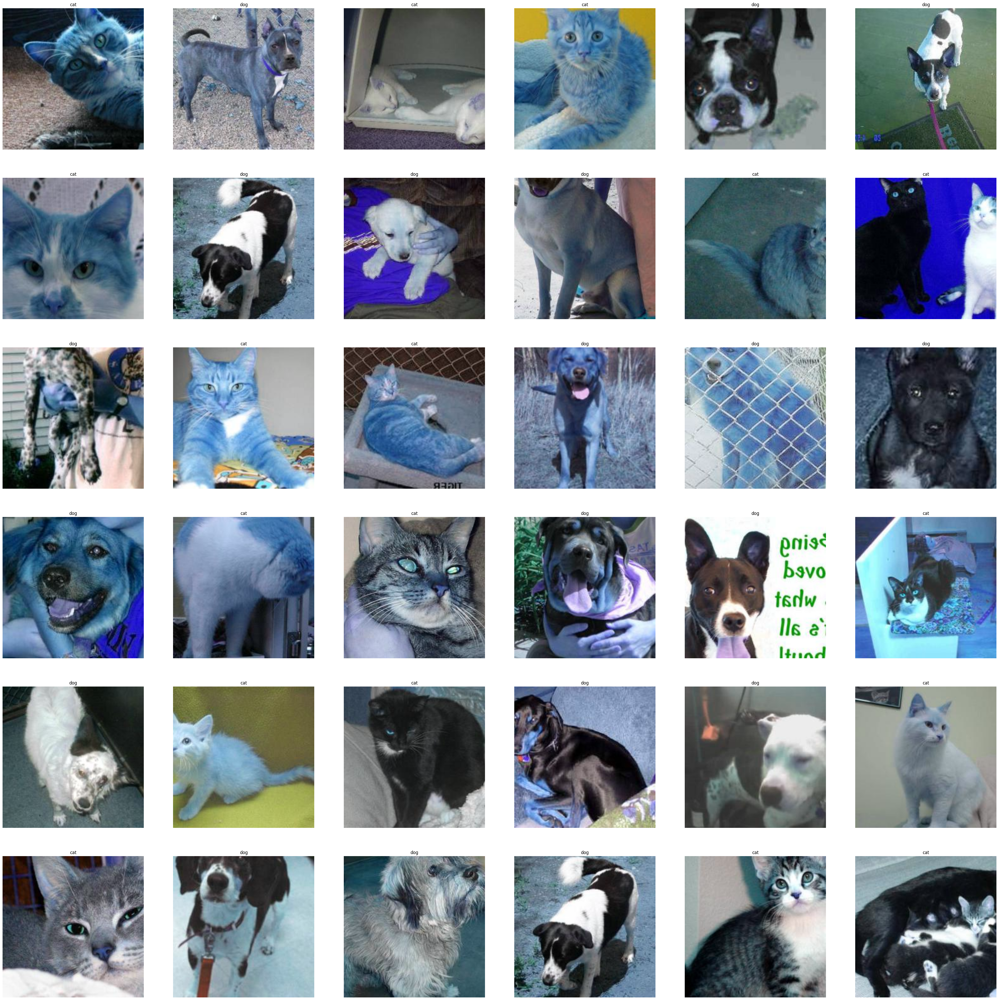

In [ ]:
plt.figure(figsize=(50,50))

for n , i in enumerate(list(np.random.randint(0,2000,36))):
    plt.subplot(6,6,n+1)
    plt.imshow(x_train[i])
    plt.axis('off')
    plt.title(category[y_train[i]])

In [ ]:
x_train_preprocessed = keras.applications.resnet.preprocess_input(x_train)

In [ ]:
x_train_preprocessed.shape

(2000, 224, 224, 3)

In [ ]:
basemodel = tf.keras.applications.resnet.ResNet101(weights='imagenet',
                                               include_top = False)
avg = keras.layers.GlobalAveragePooling2D()(basemodel.output)
dense1 = keras.layers.Dense(100, activation = 'relu', kernel_initializer='he_normal')(avg)
output_ = keras.layers.Dense(2 ,activation = 'softmax')(dense1)

transfare_model = keras.Model(inputs = basemodel.input, outputs = output_)

In [ ]:
transfare_model.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_2 (InputLayer)        [(None, None, None, 3)]      0         []                            
                                                                                                  
 conv1_pad (ZeroPadding2D)   (None, None, None, 3)        0         ['input_2[0][0]']             
                                                                                                  
 conv1_conv (Conv2D)         (None, None, None, 64)       9472      ['conv1_pad[0][0]']           
                                                                                                  
 conv1_bn (BatchNormalizati  (None, None, None, 64)       256       ['conv1_conv[0][0]']          
 on)                                                                                        

In [ ]:
for layer in basemodel.layers:
  layer.trainable = False

In [ ]:
x_train_preprocessed_  = x_train_preprocessed[100:]
y_train_ = y_train[100:]
x_val = x_train_preprocessed[:100]
y_val = y_train[:100]

In [ ]:
opt = keras.optimizers.Adam(learning_rate = 0.03)

transfare_model.compile(optimizer = opt,
                        loss = 'sparse_categorical_crossentropy',
                        metrics = ["accuracy"])

history = transfare_model.fit(x_train_preprocessed_,y_train_, epochs = 3 ,
                              validation_data=(x_val,y_val))

Epoch 1/3
60/60 [==============================] - 30s 230ms/step - loss: 1.6547 - accuracy: 0.9389 - val_loss: 0.3242 - val_accuracy: 0.9700
Epoch 2/3
60/60 [==============================] - 11s 179ms/step - loss: 0.0627 - accuracy: 0.9889 - val_loss: 0.2503 - val_accuracy: 0.9700
Epoch 3/3
60/60 [==============================] - 11s 182ms/step - loss: 0.0147 - accuracy: 0.9947 - val_loss: 0.1727 - val_accuracy: 0.9800


In [ ]:
transfare_model.evaluate(x_val,y_val)

4/4 [==============================] - 1s 119ms/step - loss: 0.1727 - accuracy: 0.9800


[0.1727456897497177, 0.9800000190734863]

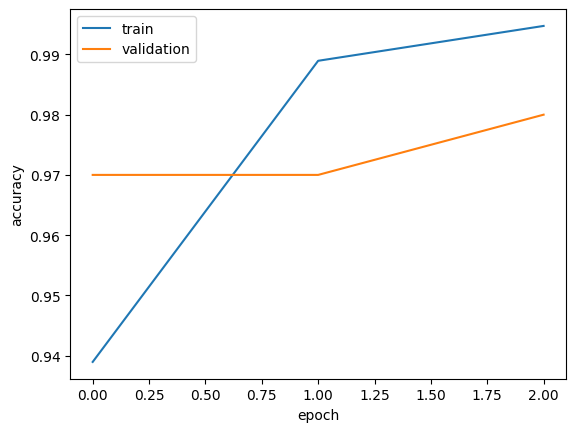

In [ ]:
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='upper left')
plt.show()

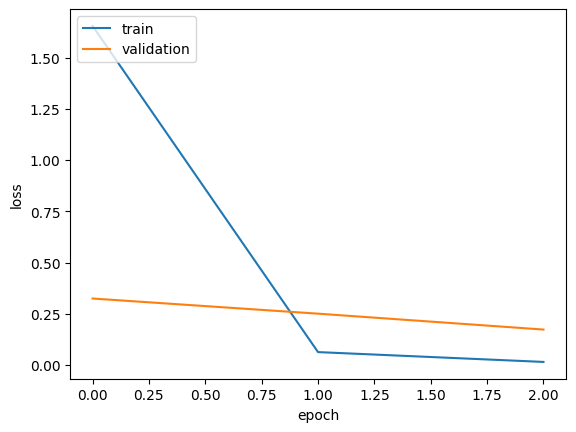

In [ ]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='upper left')
plt.show()